# Compare Dreamshaper8 with SD1.5

* **Interactive diffusion grid exploration**
  We include a notebook (`Generate_plot_grid_SD15_Dreamshaper.ipynb`) that lets you experiment with any Stable Diffusion model and visually inspect how tiny changes in two interpolation parameters (α, β) can trigger abrupt “phase transitions” in the generated images. By adjusting `interpolation_steps` and swapping in different diffusion pipelines, you can quickly see which models exhibit fractal‐like or sudden switches in output, helping to pinpoint where latent‐space geometry leads to sharp visual changes.


In [ ]:
import torch
import PIL
import numpy as np
import matplotlib.pyplot as plt

from torchvision import transforms as tfms
from diffusers import StableDiffusionPipeline
from diffusers import DDIMScheduler

from PIL import Image 
from tqdm import tqdm 

device = "cuda:1"
path = "/models/v1-5-pruned-emaonly.safetensors"
CFG_scale = 5
torch.manual_seed(3298878210511803462)

In [ ]:
# Assuming `image_grid` is your list of lists containing images
# Example structure: image_grid = [[img1, img2], [img3, img4], ...]
def plot_image_grid(image_grid):
    # Determine the number of rows and columns in the grid
    num_rows = len(image_grid)
    num_cols = len(image_grid[0]) if num_rows > 0 else 0

    # Create a figure and a grid of subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 2, num_rows * 2))

    # If there's only one row or column, `axes` will not be a 2D array, so we need to handle that
    if num_rows == 1:
        axes = [axes]
    if num_cols == 1:
        axes = [[ax] for ax in axes]

    # Iterate over the grid and display each image
    for i in range(num_rows):
        for j in range(num_cols):
            ax = axes[i][j]
            ax.imshow(image_grid[i][j])  # Display the image
            ax.axis('off')  # Hide axes

    # Adjust layout to avoid overlapping
    plt.tight_layout()
    plt.show()
def interpolated_latent(latent_0, latent_1, latent_2, alpha, beta, noise=1e-6):
    '''
    interpoolates gaussians 
    '''
    interpolated_latent =  latent_0  + alpha * (latent_1 - latent_0) + beta * (latent_2 - latent_0) + torch.randn_like(latent_0) * noise
    return interpolated_latent / interpolated_latent.std()

In [3]:
class DDIM(StableDiffusionPipeline):

    # Sample function (regular DDIM)
    @torch.no_grad()
    def sample(self, prompt, start_step=0, start_latents=None,
               guidance_scale=CFG_scale, num_inference_steps=50,
               num_images_per_prompt=1, do_classifier_free_guidance=True,
               negative_prompt='', device=device, eta=0):
      
        # Encode prompt
        text_embeddings = self._encode_prompt(
                prompt, device, num_images_per_prompt, do_classifier_free_guidance, negative_prompt
        )
        
        # Set num inference steps
        self.scheduler.set_timesteps(num_inference_steps, device=device)
    
        # Create a random starting point if we don't have one already
        if start_latents is None:
            start_latents = torch.randn(1, 4, 64, 64, device=device)
            start_latents *= self.scheduler.init_noise_sigma
    
        latents = start_latents.clone()
    
        for i in range(start_step, num_inference_steps):
        
            t = self.scheduler.timesteps[i]
    
            # Expand the latents if we are doing classifier free guidance
            latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)
    
            # Predict the noise residual
            noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample
    
            # Perform guidance
            if do_classifier_free_guidance:
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    
            # Normally we'd rely on the scheduler to handle the update step:
            # latents = pipe.scheduler.step(noise_pred, t, latents).prev_sample
    
            # Instead, let's do it ourselves:
            prev_t = max(1, t.item() - (1000//num_inference_steps)) # t-1
            alpha_t = self.scheduler.alphas_cumprod[t.item()]
            alpha_t_prev = self.scheduler.alphas_cumprod[prev_t]
            predicted_x0 = (latents - (1-alpha_t).sqrt()*noise_pred) / alpha_t.sqrt()
            # direction_pointing_to_xt = (1-alpha_t_prev).sqrt()*noise_pred

            # Compute the variance for stochastic sampling
            # c1 = (1 - alpha_t_prev) / (1 - alpha_t) * (1 - alpha_t / alpha_t_prev)
            # c1 = torch.sqrt(variance) * eta
            c1 = (1 - alpha_t_prev).sqrt() * eta
            c2 = (1 - alpha_t_prev).sqrt() * ((1 - eta ** 2) ** 0.5) 
                            # x0_t = (x_t - noise_pred * (1 - at).sqrt()) / at.sqrt() # eq.12
                            # c1 = (1 - at_next).sqrt() * eta
                            # c2 = (1 - at_next).sqrt() * ((1 - eta ** 2) ** 0.5) 
                            # x_t = at_next.sqrt() * x0_t_hat + c1 * torch.randn_like(x0_t) + c2 * noise_pred
            noise = torch.randn_like(latents) if ( eta > 0 and i < num_inference_steps-1 ) else torch.zeros_like(latents)
            
            latents = alpha_t_prev.sqrt()*predicted_x0  + c1 * noise + c2 * noise_pred
    
        # Post-processing
        images = self.decode_latents(latents)
        images = self.numpy_to_pil(images)
        return images
        
    @torch.no_grad()    
    def sample_with_latents(self, prompt, start_step=0, start_latents=None,
           guidance_scale=CFG_scale, num_inference_steps=50,
           num_images_per_prompt=1, do_classifier_free_guidance=True,
           negative_prompt='', device=device):
      
        # Encode prompt
        text_embeddings = self._encode_prompt(
                prompt, device, num_images_per_prompt, do_classifier_free_guidance, negative_prompt
        )
        
        # Set num inference steps
        self.scheduler.set_timesteps(num_inference_steps, device=device)
    
        # Create a random starting point if we don't have one already
        if start_latents is None:
            start_latents = torch.randn(1, 4, 64, 64, device=device)
            start_latents *= self.scheduler.init_noise_sigma
    
        latents = start_latents.clone()
        store_latents = []
        for i in range(start_step, num_inference_steps):
        
            t = self.scheduler.timesteps[i]
    
            # Expand the latents if we are doing classifier free guidance
            latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)
    
            # Predict the noise residual
            noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample
    
            # Perform guidance
            if do_classifier_free_guidance:
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
    
            # Normally we'd rely on the scheduler to handle the update step:
            # latents = pipe.scheduler.step(noise_pred, t, latents).prev_sample
    
            # Instead, let's do it ourselves:
            prev_t = max(1, t.item() - (1000//num_inference_steps)) # t-1
            alpha_t = self.scheduler.alphas_cumprod[t.item()]
            alpha_t_prev = self.scheduler.alphas_cumprod[prev_t]
            predicted_x0 = (latents - (1-alpha_t).sqrt()*noise_pred) / alpha_t.sqrt()
            direction_pointing_to_xt = (1-alpha_t_prev).sqrt()*noise_pred
            latents = alpha_t_prev.sqrt()*predicted_x0 + direction_pointing_to_xt
            if (i+1) % 10 == 0:
                store_latents.append(latents.detach().cpu())
        # Post-processing
        images = self.decode_latents(latents)
        images = self.numpy_to_pil(images)
        return images, store_latents

    @torch.no_grad()
    def encode_image_2(self, image: PIL.Image):
        latent = self.vae.encode(tfms.functional.to_tensor(image).unsqueeze(0).to(device)*2-1)
        return 0.18215 * latent.latent_dist.sample()
        
    @torch.no_grad()
    def invert(self, start_latents, prompt, guidance_scale=CFG_scale, num_inference_steps=50,
               num_images_per_prompt=1, do_classifier_free_guidance=True,
               negative_prompt='', device=device):
      
        text_embeddings = self._encode_prompt(
                prompt, device, num_images_per_prompt, do_classifier_free_guidance, negative_prompt
        )
        
        # Latents are now the specified start latents
        latents = start_latents.clone()

        # # We'll keep a list of the inverted latents as the process goes on
        # intermediate_latents = []
    
        self.scheduler.set_timesteps(num_inference_steps, device=device)
    
        # Reversed timesteps <<<<<<<<<<<<<<<<<<<<
        timesteps = reversed(self.scheduler.timesteps)
        for i in tqdm(range(1, num_inference_steps), total=num_inference_steps-1):
    
            # We'll skip the final iteration
            if i >= num_inference_steps - 1: continue
    
            t = timesteps[i]
            print(t)
    
            # Expand the latents if we are doing classifier free guidance
            latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)
    
            # Predict the noise residual
            noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample
    
            # Perform guidance
            if do_classifier_free_guidance:
                noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
    
            current_t = max(0, t.item() - (1000//num_inference_steps)) #t
            next_t = t # min(999, t.item() + (1000//num_inference_steps)) # t+1
            alpha_t = self.scheduler.alphas_cumprod[current_t]
            alpha_t_next = self.scheduler.alphas_cumprod[next_t]
    
            # Inverted update step (re-arranging the update step to get x(t) (new latents) as a function of x(t-1) (current latents)
            latents = (latents - (1-alpha_t).sqrt()*noise_pred)*(alpha_t_next.sqrt()/alpha_t.sqrt()) + (1-alpha_t_next).sqrt()*noise_pred
    
            # # Store
            # intermediate_latents.append(latents)
                
        return latents # torch.cat(intermediate_latents)



In [4]:
pipe = DDIM.from_single_file(path)
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
pipe.to(device);

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
You have disabled the safety checker for <class '__main__.DDIM'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [5]:
start_latents = torch.load('../data/stable_version_latents.pt').to(device)
print(start_latents.shape)

torch.Size([3, 1, 4, 64, 64])


/tmp/ipykernel_2129501/3946435557.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  start_latents = torch.load('../data/stable_version_latents.pt').to(device)


In [6]:
prompt = 'High quality picture, 4k, detailed' #'Beautiful DSLR Photograph of a penguin on the beach, golden hour'
negative_prompt = 'blurry, ugly, stock photo'
seed = np.random.randint(1e9)
print(seed)
torch.manual_seed(seed)

764771202


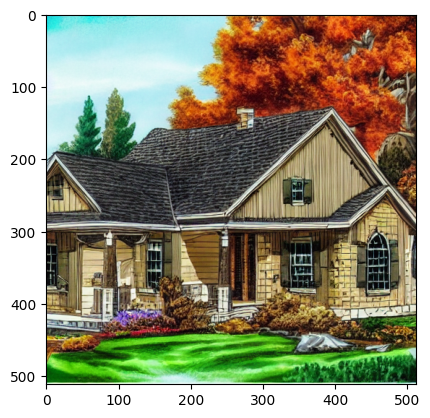

In [27]:
# start_latent1 = start_latents[0]  #torch.randn(1, 4, 64, 64, device=device) + 
start_latent1 = torch.randn(1, 4, 64, 64, device=device)
start_latent1 *= pipe.scheduler.init_noise_sigma
# start_latent1 /= start_latent1.std() 

im1 = pipe.sample(prompt, negative_prompt=negative_prompt, start_latents=start_latent1)[0]
plt.imshow(im1)

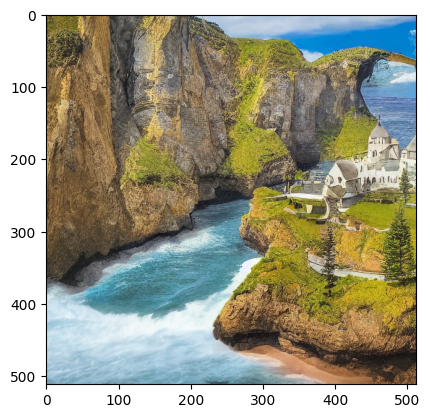

In [18]:
# start_latent2 = start_latents[1] #torch.randn(1, 4, 64, 64, device=device)
start_latent2 = torch.randn(1, 4, 64, 64, device=device)
start_latent2 *= pipe.scheduler.init_noise_sigma
# start_latent2 /= start_latent2.std()

im2 = pipe.sample(prompt, negative_prompt=negative_prompt, start_latents=start_latent2)[0]
plt.imshow(im2)

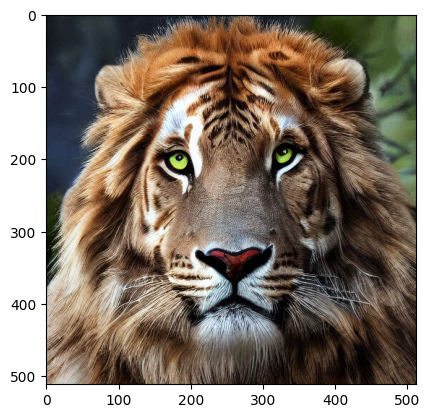

In [30]:
start_latent3 = torch.randn(1, 4, 64, 64, device=device)
start_latent3 *= pipe.scheduler.init_noise_sigma
# start_latent3 /= start_latent3.std()

im3 = pipe.sample(prompt, negative_prompt=negative_prompt, start_latents=start_latent3)[0]
plt.imshow(im3)

In [34]:
interpolation_steps = 10
alpha_values = np.linspace(0.0,1,interpolation_steps)
beta_values =  np.linspace(0.0,1,interpolation_steps)
results = []

for i, alpha  in tqdm(enumerate(alpha_values)):
    buf = []
    for j, beta in enumerate(beta_values):
        latent = interpolated_latent(start_latent1,start_latent2,start_latent3, alpha, beta, noise=0)
        im = pipe.sample(prompt, negative_prompt=negative_prompt, start_latents=latent, eta=0.0)[0]
        buf.append(im)
    results.append(buf)

0it [00:00, ?it/s]/home/alexander/research/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:283: FutureWarning: `_encode_prompt()` is deprecated and it will be removed in a future version. Use `encode_prompt()` instead. Also, be aware that the output format changed from a concatenated tensor to a tuple.
  deprecate("_encode_prompt()", "1.0.0", deprecation_message, standard_warn=False)
/home/alexander/research/lib/python3.10/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:569: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)
10it [05:34, 33.41s/it]


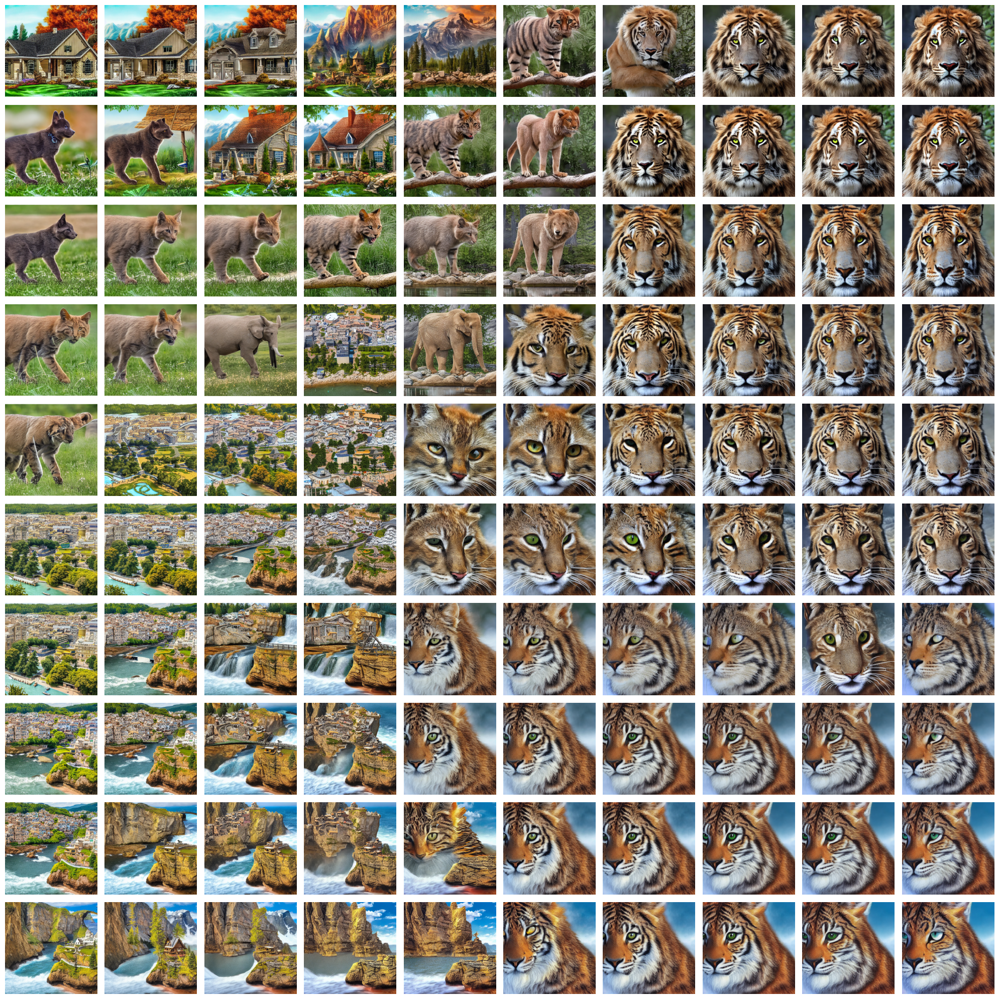

In [35]:
plot_image_grid(results)

In [ ]:
# torch.save(torch.concat([start_latent1,start_latent2,start_latent3],dim=0),'v1-5-pruned-emaonly.pt')